In [1]:
import numpy as np
import mdtraj as md
import matplotlib.pyplot as plt
import nglview as nv

# Path: pymdna/__init__.py, prototype of the package and atomic is not properly referenced in the package at genertors.py now I just explicitly define the path loction
import pymdna as mdna

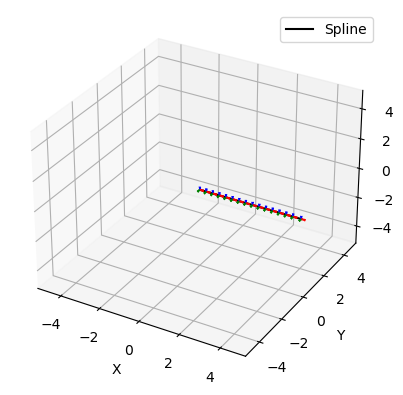

(<Figure size 640x480 with 1 Axes>,
 <Axes3D: xlabel='X', ylabel='Y', zlabel='Z'>)

In [2]:
control_points = mdna.Shapes.line(5,num_points=5)
spline = mdna.SplineFrames(control_points=control_points, num_points=100)
spline.plot_frames(equal_bounds=True)

/Users/thor/surfdrive/Projects/genDNA/workspace/pymdna/utils.py:54: RuntimeWarning: invalid value encountered in divide
  omega_normalized = np.where(omega_norm != 0, omega / omega_norm, omega)


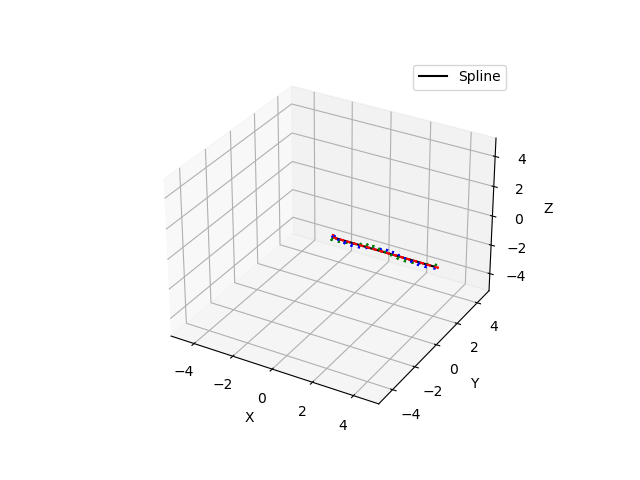

(array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
        0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  , 1.05,
        1.1 , 1.15, 1.2 , 1.25, 1.3 , 1.35, 1.4 , 1.45, 1.5 , 1.55, 1.6 ,
        1.65, 1.7 , 1.75, 1.8 , 1.85, 1.9 , 1.95, 2.  , 2.05, 2.1 , 2.15,
        2.2 , 2.25, 2.3 , 2.35, 2.4 , 2.45, 2.5 , 2.55, 2.6 , 2.65, 2.7 ,
        2.75, 2.8 , 2.85, 2.9 , 2.95, 3.  , 3.05, 3.1 , 3.15, 3.2 , 3.25,
        3.3 , 3.35, 3.4 , 3.45, 3.5 , 3.55, 3.6 , 3.65, 3.7 , 3.75, 3.8 ,
        3.85, 3.9 , 3.95, 4.  , 4.05, 4.1 , 4.15, 4.2 , 4.25, 4.3 , 4.35,
        4.4 , 4.45, 4.5 , 4.55, 4.6 , 4.65, 4.7 , 4.75, 4.8 , 4.85, 4.9 ,
        4.95]),
 17,
 array([[1., 0., 0.],
        [0., 1., 0.],
        [0., 0., 1.]]),
 array([[ 0.        ,  0.98883083,  0.14904227],
        [ 0.        ,  0.14904227, -0.98883083],
        [ 1.        ,  0.        ,  0.        ]]))

In [4]:
%matplotlib ipympl

# Generate DNA between two points ...
# We use the spline to define the path between the two points where the points are equidistant with respect to each other.
# The spline is defined by a set of control points. The number of control points is arbitrary.
# At each point we generate a frame. The frame is defined by the position of the basepairs and the orientation of the basepairs.
# The orientation is defined using a reference basis consisting of 3 vectors: 
    # forward (tangent of curvature of spline in the direction of the next point)
    # up (in the direction of the major groove) 
    # and right (in the direction of the sugar group of the leading strand).

# The number of points and positions on the spline is determined by its arclength and how many basepairs can be distributed based on the rise parameter.
# The orientation of the first and final frame is fixed. This gives rise to the following situations:

    # Number of base pairs per turn:
        # fixed at 10.5
        # variable (underwound or overwound)

    # Number of base pairs: 
        # fixed based on sequence to be generated
        # variable based on path between points

    # Rise per base pair:
        # fixed at 0.34 nm

# How do we generate the path between two points?
# Start with case where rise is fixed, number of base pairs and arclength/path are variable, but orienation of base pair (twist) of first and last base pair is fixed.

import numpy as np
import scipy.optimize as optimize
from scipy.interpolate import CubicSpline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define the start and end points and their orientation vectors
start_point = np.array([0, 0, 0])
end_point = np.array([5, 0, 0])

start_orientation = {'forward': np.array([1, 0, 0]), 'up': np.array([0, 1, 0]), 'right': np.array([0, 0, 1])}
end_orientation = {'forward': np.array([1, 0, 0]), 'up': np.array([0, 1, 0]), 'right': np.array([0, 0, -1])}

# Define initial control points for the spline
control_points = np.array([
    start_point,
    (start_point + end_point) * 0.25,  # Quarter of the way
    (start_point + end_point) * 0.75,  # Three quarters of the way
    end_point
])

# Generate initial spline
# Calculate arc length of spline, see how many base pairs can be distributed along the spline
# Start with the initial points orientation and calculate the orientation of the next point by twisting based on 10.5 base pairs per turn
# Define the initial frame
initial_frame = np.array([[0,0,0],[1,0,0],[0,1,0],[0,0,1]])
spline = mdna.SplineFrames(control_points=control_points, num_points=100, initial_frame=initial_frame)

spline.twist_frames()
spline.plot_frames(equal_bounds=True)

spline.arc_length, spline.frames.shape[0], spline.frames[0][1:], spline.frames[-1][1:]

In [23]:
def guess_control_points(start_point, end_point, start_orientation, end_orientation, segments=3):
    '''Calculates initial control points based on start and end points and orientations.
        Increase segements to place guessed control points closer to the outer ends.
        
    Note, this function should be refined to take into account the respective directions of the first and last base pair. '''
    
    path_length = np.linalg.norm(end_point - start_point)
    control_point_1 = start_point + start_orientation[0] * (path_length / segments)
    control_point_2 = end_point - end_orientation[0] * (path_length / segments)
    return np.array([start_point, control_point_1, control_point_2, end_point]), path_length

# Define start and end points and their orientations
start_point = np.array([0, 0, 0])
end_point = np.array([5, 0, 0])
start_orientation = np.array([[1, 0, 0], [0, 1, 0], [0, 0, 1]])  # forward, up, right located at start point
end_orientation = np.array([[1, 0, 0], [0, 1, 0], [0, 0, -1]])   # forward, up, right (inverted) located at end point

# Compute difference between start and end orientations along the forward vector (twist) 
# I think I need to align the forward vectors first and then compute the difference in orientation
rotation_difference = np.rad2deg(np.arccos(np.dot(start_orientation[-1], end_orientation[-1])))

# Calculate control points and minimal path length
control_points, path_length = guess_control_points(start_point, end_point, start_orientation, end_orientation, segments=3)

# Calculate the number of base pairs that can be distributed along the path
n_bp = path_length / 0.34

# set the number of base pairs per turn
bp_per_turn = 10.5 # maybe use this within a margin of 0.1 bp/turn to tweak the number of base pairs

# calculate the number of turns
n_turns = n_bp / bp_per_turn

# Compute the cummulative twist assuming a constant twist per base pair
cumulative_twists = np.linspace(0, n_turns * 360, int(n_bp))

# Compute the excess twist in turns 
decimal_twist = (1- (n_turns - int(n_turns))) * 360
extra_bases = decimal_twist / 360 * bp_per_turn

decimal_twist, extra_bases

# print(n_bp, n_turns, rotation_difference, missing_twist, extra_bases)
n_bp, extra_bases


(14.705882352941176, 6.294117647058824)

NameError: name 'cumulative_twists' is not defined

In [48]:
# Given two points and their orientations as origin (xyz), forward, up, right vectors 
# Calculate the control points and the number of base pairs that can be distributed along the path
# Each increment of the base pair is 0.34 nm with respect to the previous orientation frame,
# and rotates clockwise 36 degrees along the forward vector, which is defined as the tangent of the curvature of the spline in the direction of the next point.

# Algorithm:


(5.9940000000000495, 19, array([0., 0., 0.]), array([6., 0., 0.]))

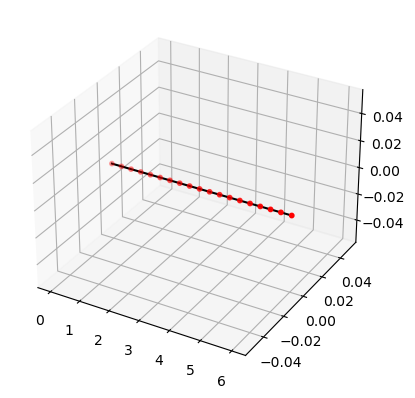

In [253]:
from scipy.interpolate import splprep, splev
from scipy.integrate import cumtrapz

def guess_control_points(start_point, end_point, start_orientation, end_orientation, segments=3):
    '''Calculates initial control points based on start and end points and orientations.
        Increase segements to place guessed control points closer to the outer ends.
    '''
    path_length = np.linalg.norm(end_point - start_point)
    control_point_1 = start_point + start_orientation[0] * (path_length / segments)
    control_point_2 = end_point - end_orientation[0] * (path_length / segments)
    return np.array([start_point, control_point_1, control_point_2, end_point])

# Parameters
frame_spacing = 0.34  # nm
frame_tolerance = 0.01  # nm

# Define start and end points and their orientations
start_point = np.array([0, 0, 0])
end_point = np.array([6, 0, 0])
start_orientation = np.array([[1, 0, 0], [0, 1, 0], [0, 0, 1]])  # forward, up, right located at start point
end_orientation = np.array([[1, 0, 0], [0, 1, 0], [0, 0, -1]])   # forward, up, right (inverted) located at end point

control_points_guess = guess_control_points(start_point, end_point, start_orientation, end_orientation, segments=3)
tck, _ = splprep(control_points_guess.T, s=0, k=3)

n = 1000
dt = 1 / n
v = np.arange(0, 1 + dt, dt)
curve = np.array(splev(v, tck)).T
der1 = np.array(splev(v, tck, der=1)).T
der2 = np.array(splev(v,tck, der=2)).T


# Calculate the arc length of the spline
arc_diffs = np.diff(curve, axis=0)
arc = np.sqrt((arc_diffs**2).sum(axis=1))
arc_length = np.hstack([0, cumtrapz(arc)])

# Calculate the new segment length within the specified tolerance
adjusted_arc_length = arc_length[-1] - frame_spacing  # Subtract the first and last segments
num_segments = np.round(adjusted_arc_length / frame_spacing)
new_segment_length = adjusted_arc_length / num_segments

# If the new segment length is within the tolerance, proceed with the distribution
if abs(new_segment_length - frame_spacing) <= frame_tolerance:
    segment_lengths = np.linspace(new_segment_length, adjusted_arc_length, int(num_segments))

    # Including the first and last points (and not the last segment if closed topology)
    t_values = [0] + list(np.interp(segment_lengths, arc_length, v[:len(arc_length)])) + [1]

    # Evaluate the spline and its derivatives at the reparametrized t values
    equidistant_points = np.array(splev(t_values, tck)).T
    derivatives = np.array(splev(t_values, tck, der=1)).T
else:
    raise ValueError(f"Cannot find a suitable segment length within the tolerance of {frame_tolerance} nm rise.")

# Store or return the results
positions = equidistant_points
derivatives = derivatives

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

_ = tck[0]  # Spline parameters for plotting
u = np.linspace(0, 1, 100)
spline_points = np.array(splev(u, tck)).T
ax.plot(*spline_points.T, color='k', label='Spline')
ax.scatter(*positions.T, color='r', label='Points',s = 10)

arc_length[-1], len(positions), positions[0], positions[-1]
#np.round(positions,3)

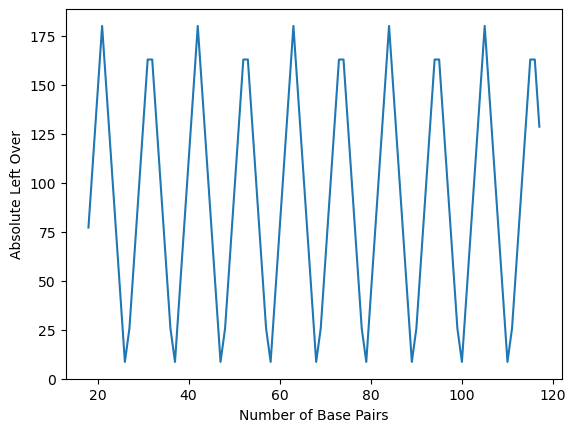

Optimal BP: 26, Twist Difference per BP: -0.33 degrees


37

In [420]:
import numpy as np
import matplotlib.pyplot as plt

def find_minima(lst):
    """Finds the indices of local minima in a list."""
    return [i for i in range(1, len(lst) - 1) if lst[i - 1] > lst[i] and lst[i + 1] > lst[i]]

def compute_left_over(bp_range, min_bp, bp_per_turn, rotation_difference):
    """Computes the left-over rotational difference for a range of base pairs."""
    cumul_twist = np.arange(min_bp, min_bp + bp_range) * 360 / bp_per_turn
    return cumul_twist % 360 - rotation_difference

def compute_twist_diff_per_bp(optimal_bp, left_over, min_bp):
    """Calculates the twist difference per base pair for an optimal base pair number."""
    total_twist_diff = left_over[optimal_bp - min_bp]
    return total_twist_diff / optimal_bp

def check_within_tolerance(twist_diff_per_bp, tolerance):
    """Checks if the twist difference per base pair is within the specified tolerance."""
    return np.abs(twist_diff_per_bp) < tolerance

def find_optimal_bps(positions, bp_per_turn, rise, bp_range, rotation_difference, tolerance, plot=False):
    """Finds optimal base pairs that satisfy the given tolerance.

    Args:
    positions: The positions of base pairs.
    bp_per_turn: Base pairs per turn.
    rise: Component of arc length.
    bp_range: Range of base pairs to consider.
    rotation_difference: The target rotation difference.
    tolerance: The tolerance for accepting an optimal base pair number.
    plot: If True, plots the left-over rotational differences.

    Returns:
    A list of dictionaries containing optimal base pair numbers and their twist differences per base pair.
    """
    min_arc = np.linalg.norm(positions[0] - positions[-1])
    min_bp = int(np.ceil(min_arc / rise))
    left_over = compute_left_over(bp_range, min_bp, bp_per_turn, rotation_difference)

    if plot:
        # Plotting the left-over rotational differences
        plt.plot(np.arange(min_bp, min_bp + len(left_over)), np.abs(left_over))
        plt.xlabel('Number of Base Pairs')
        plt.ylabel('Absolute Left Over')
        plt.show()

    minima = find_minima(np.abs(left_over))
    results = []

    for min_val in minima:
        optimal_bp = min_bp + min_val
        twist_diff_per_bp = compute_twist_diff_per_bp(optimal_bp, left_over, min_bp)
        if check_within_tolerance(twist_diff_per_bp, tolerance):
            results.append({
                'optimal_bp': optimal_bp,
                'twist_diff_per_bp': np.round(twist_diff_per_bp, 3)
            })
    if len(results) > 0:
        for result in results[:1]:
            print(f'Optimal BP: {result["optimal_bp"]}, Twist Difference per BP: {result["twist_diff_per_bp"]} degrees')
    else:
        print("No optimal number of base pairs found within the specified tolerance.")
    return results

# Example usage:
# Assuming positions is a predefined array of positions
bp_per_turn = 10.5
rise = 0.34
bp_range = 100
rotation_difference = 180 
tolerance = np.abs((360 / 10.4) - (360 / 10.6))

optimal_bps = find_optimal_bps(positions, bp_per_turn, rise, bp_range, rotation_difference, tolerance, plot=True)
n_bp = optimal_bps[1]['optimal_bp']
n_bp

### Brute force optimization

237.04042897434235 0.253939332613938 236.78648964172842
237.0404271493378 0.2539393347150421 236.78648781462277
237.04046687114325 0.253939332111904 236.78652753903134
237.0404563139956 0.253939332296221 236.78651698169938
237.04042692080466 0.25393933099425425 236.7864875898104
237.04040727063642 0.2539393329999494 236.78646793763647
237.04041325033592 0.25393933275988334 236.78647391757605
237.04042897616634 0.2539393344379297 236.78648964172842
237.0404289738922 0.2539393321637813 236.78648964172842
237.04042897453516 0.253939332806736 236.78648964172842
237.04042897271628 0.2539393309878564 236.78648964172842
237.0404289746261 0.2539393328976913 236.78648964172842
237.04042897406072 0.25393933233228233 236.78648964172842
237.04043305860597 0.25393933386545214 236.78649372474052
237.04041107947035 0.2539393330897177 236.78647174638064
237.0404418958857 0.253939332150679 236.786502563735
237.04042629619423 0.2539393312154572 236.78648696497876
237.04046158447915 0.25393933199470664 2

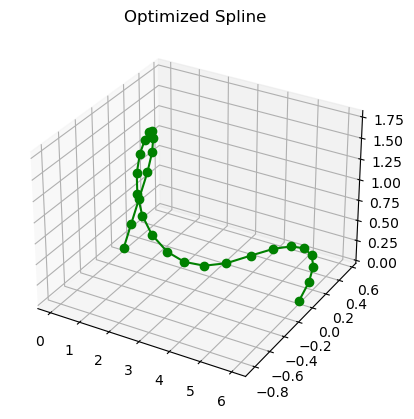

Optimization successful: True
Function value: 58.714912026629214


(0.0, 16.453815550574838)

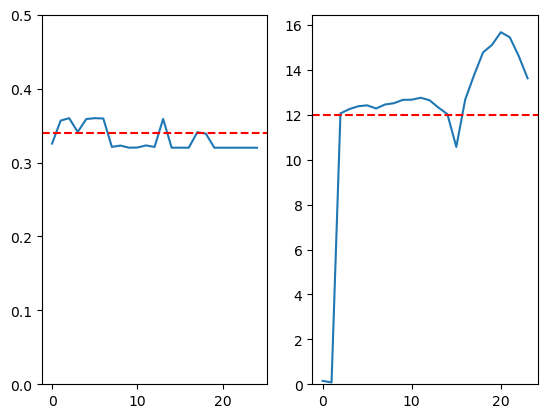

In [442]:
import numpy as np
import scipy.optimize as opt
import matplotlib.pyplot as plt

def generate_initial_points(initial_point, final_point, n_points):
    linear_points = np.linspace(initial_point, final_point, n_points)
    perturbation = np.random.rand(n_points, 3) * 0.05
    perturbation[0] = perturbation[-1] = [0, 0, 0]
    return linear_points + perturbation

def calculate_bending_angles(points):
    angles = []
    for i in range(1, len(points) - 1):
        v1 = points[i] - points[i - 1]
        v2 = points[i + 1] - points[i]
        angle_rad = np.arccos(np.clip(np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2)), -1.0, 1.0))
        angle_deg = np.degrees(angle_rad)
        angles.append(angle_deg)
    return np.array(angles)

def segment_length_constraint_old(control_points, initial_point, final_point, target_length, tolerance=0.01):
    points = np.vstack([initial_point, control_points.reshape(-1, 3), final_point])
    segment_lengths = np.sqrt(np.sum(np.diff(points, axis=0)**2, axis=1))
    # Constraint: sum of differences (tolerance - abs deviation) should be non-negative
    return np.sum(tolerance*(len(points)) - np.abs(segment_lengths - target_length))

def segment_length_constraint(control_points, initial_point, final_point, target_length, max_deviation=0.02):
    points = np.vstack([initial_point, control_points.reshape(-1, 3), final_point])
    segment_lengths = np.sqrt(np.sum(np.diff(points, axis=0)**2, axis=1))
    # Check if any segment length deviates more than max_deviation from the target length
    deviation = np.abs(segment_lengths - target_length)
    # Constraint: each deviation must be less than or equal to max_deviation
    return np.min(max_deviation - deviation)

def bending_angle_constraint(control_points, initial_point, final_point, max_angle):
    points = np.vstack([initial_point, control_points.reshape(-1, 3), final_point])
    angles = calculate_bending_angles(points)
    # Constraint: sum of differences (max_angle - angles) should be non-negative
    return np.sum(max_angle - angles)

def objective_function_(control_points, initial_point, final_point):
    points = np.vstack([initial_point, control_points.reshape(-1, 3), final_point])
    segment_lengths = np.sqrt(np.sum(np.diff(points, axis=0)**2, axis=1))
    length_penalty = np.sum((segment_lengths - target_length)**2)
    angles = calculate_bending_angles(points)
    angle_penalty = np.sum([(angle - angle_threshold)**2 if angle > angle_threshold else 0 for angle in angles])
    return (length_penalty*1) * angle_penalty*2

def objective_function(control_points, initial_point, final_point):
    points = np.vstack([initial_point, control_points.reshape(-1, 3), final_point])
    segment_lengths = np.sqrt(np.sum(np.diff(points, axis=0)**2, axis=1))
    length_penalty = np.sum((segment_lengths - target_length)**2)
    
    angles = calculate_bending_angles(points)
    angle_penalty = np.sum([(angle - angle_threshold)**2 if angle > angle_threshold else 0 for angle in angles])
    
    # # Introduce a stronger penalty for large deviations in angle
    # # Example: using a quadratic term for large deviations
    # angle_exceed_penalty = np.sum([(angle - angle_threshold)**4 if angle > angle_threshold else 0 for angle in angles])
    print(length_penalty+angle_penalty,length_penalty,angle_penalty)
    return length_penalty + angle_penalty# + angle_exceed_penalty

def optimize_spline(initial_point, final_point, n_points, target_length, angle_threshold):
    initial_guess = generate_initial_points(initial_point, final_point, n_points)[1:-1].flatten()
    constraints = [
        {'type': 'ineq', 'fun': lambda x: segment_length_constraint(x, initial_point, final_point, target_length)},
        {'type': 'ineq', 'fun': lambda x: bending_angle_constraint(x, initial_point, final_point, angle_threshold)}
    ]
    result = opt.minimize(objective_function, initial_guess, args=(initial_point, final_point),
                          constraints=constraints, method='SLSQP', options={'maxiter': 3000})

    if result.success:
        optimized_points = np.vstack([initial_point, result.x.reshape(-1, 3), final_point])
    else:
        optimized_points = None

    return optimized_points, result

def plot_spline(points, title):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.plot(points[:, 0], points[:, 1], points[:, 2], 'o-', color='green')
    ax.set_title(title)
    plt.show()

# Define initial and final points, number of points, target length and angle threshold
initial_point = np.array([0, 0, 0])
final_point = np.array([1, 1, 1])
n_points = 6

# Optimize the spline
target_length = 0.34
angle_threshold = 12
optimized_points, optimization_result = optimize_spline(positions[0], positions[-1], 26, target_length, angle_threshold)
#optimized_points, optimization_result = optimize_spline(initial_point, final_point, n_points, target_length, angle_threshold)

# Plot the result if optimization was successful
if optimized_points is not None:
    plot_spline(optimized_points, "Optimized Spline")
    print("Optimization successful:", optimization_result.success)
    print("Function value:", optimization_result.fun)
else:
    print("Optimization failed.")

final_angles = list(calculate_bending_angles(optimized_points))
final_lengths = np.sqrt(np.sum(np.diff(optimized_points, axis=0)**2, axis=1))

fig,ax = plt.subplots(1,2)
ax[0].plot(final_lengths)
ax[1].plot(final_angles)
ax[0].axhline(target_length, color='r', linestyle='--')
ax[1].axhline(angle_threshold, color='r', linestyle='--')
ax[0].set_ylim(0,0.5)
ax[1].set_ylim(0,None)

### WLC optimization

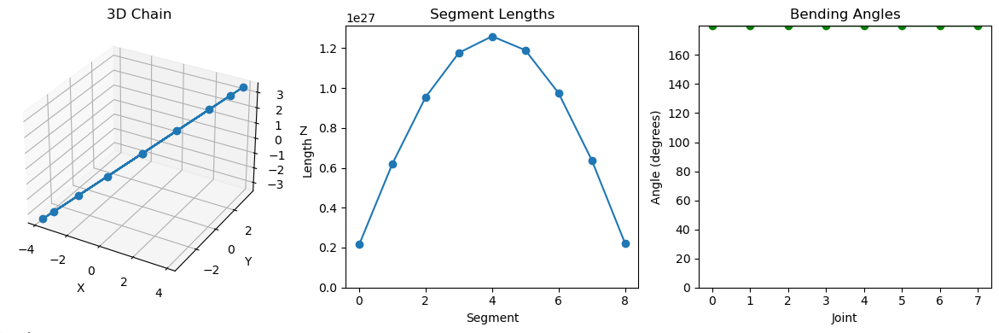

In [453]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def initialize_chain_randomly(start_point, end_point, n_points, noise_scale=0.05):
    """
    Initialize the chain of points linearly between the start and end points,
    with a small random noise added to each point.
    """
    linear_chain = np.linspace(start_point, end_point, n_points)
    noise = np.random.normal(scale=noise_scale, size=linear_chain.shape)
    noise[0, :] = 0  # No noise for the start point
    noise[-1, :] = 0  # No noise for the end point
    return linear_chain + noise

def bending_angle(v1, v2):
    """
    Calculate the bending angle between two vectors in degrees.
    """
    angle_rad = np.arccos(np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2)))
    return np.degrees(angle_rad)

def check_distance_constraint(chain, desired_distance, tolerance):
    """
    Ensure each segment is approximately the desired distance within a tolerance.
    """
    distances = np.linalg.norm(np.diff(chain, axis=0), axis=1)
    return np.all(np.abs(distances - desired_distance) <= tolerance)

def check_bending_constraint(chain, max_angle):
    """
    Ensure the bending angles between consecutive segments do not exceed max_angle.
    """
    for i in range(1, len(chain) - 1):
        v1 = chain[i] - chain[i - 1]
        v2 = chain[i + 1] - chain[i]
        if bending_angle(v1, v2) > max_angle:
            return False
    return True

def calculate_harmonic_forces(chain, desired_distance, max_angle, persistence_length, k_distance=10000.0, k_angle=1000.0,k_persistence=1000.0):
    """
    Calculate the forces acting on each point using harmonic potentials for the distance and bending constraints.
    """
    n = len(chain)
    forces = np.zeros_like(chain)

    # Forces due to distance constraint (Harmonic potential)
    for i in range(1, n - 1):
        v_prev = chain[i] - chain[i - 1]
        v_next = chain[i + 1] - chain[i]

        # Calculate force due to deviation from desired distance
        dist_prev = np.linalg.norm(v_prev)
        dist_next = np.linalg.norm(v_next)
        force_magnitude_prev = k_distance * (dist_prev - desired_distance)
        force_magnitude_next = k_distance * (dist_next - desired_distance)
        forces[i] += force_magnitude_prev * (v_prev / dist_prev)
        forces[i] -= force_magnitude_next * (v_next / dist_next)

    # # Forces due to bending constraint (Harmonic potential)
    # for i in range(1, n - 2):
    #     v1 = chain[i] - chain[i - 1]
    #     v2 = chain[i + 1] - chain[i]

    #     angle = bending_angle(v1, v2)
    #     if angle > max_angle:
    #         # Calculate force due to deviation from max angle
    #         force_magnitude = k_angle * (angle - max_angle)
    #         correction_vector = (v2 / np.linalg.norm(v2)) - (v1 / np.linalg.norm(v1))
    #         forces[i] += force_magnitude * correction_vector


    # Forces due to persistence length
    for i in range(1, n - 2):
        v1 = chain[i] - chain[i - 1]
        v2 = chain[i + 1] - chain[i]
        local_curvature = np.arccos(np.clip(np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2)), -1.0, 1.0))

        # Calculate deviation from the expected curvature based on persistence length
        # The persistence length relates to the bending rigidity of the chain
        # Assuming a simple relationship where larger persistence length implies less bending
        expected_curvature = np.exp(-desired_distance / persistence_length)
        deviation_from_expected = local_curvature - expected_curvature

        # Apply a force proportional to this deviation
        force_magnitude = k_persistence * deviation_from_expected
        correction_vector = (v2 / np.linalg.norm(v2)) - (v1 / np.linalg.norm(v1))
        forces[i] += force_magnitude * correction_vector

    return forces

def integrate_motion(chain, forces, dt, mass=1.0):
    """
    Update the positions of the points using the calculated forces and simple Euler integration.
    """
    velocities = np.zeros_like(chain)
    # Euler integration to update positions and velocities
    velocities += forces / mass * dt
    chain += velocities * dt
    return chain

def molecular_dynamics_simulation_harmonic(start_point, end_point, n_points, desired_distance, tolerance, max_angle, persistence_length, dt, steps, k_distance=1000, k_angle=1.0,k_persistence=1000):
    chain = initialize_chain_randomly(start_point, end_point, n_points)
    for _ in range(steps):
        forces = calculate_harmonic_forces(chain, desired_distance, max_angle, persistence_length, k_distance,k_persistence)
        chain = integrate_motion(chain, forces, dt)
        if check_distance_constraint(chain, desired_distance, tolerance) and \
           check_bending_constraint(chain, max_angle):
            break
    return chain

def plot_chain(chain):
    """
    Plot the 3D chain of points, segment lengths, and bending angles.
    """
    fig = plt.figure(figsize=(12, 4))

    # Plotting the 3D chain
    ax1 = fig.add_subplot(131, projection='3d')
    ax1.plot(chain[:, 0], chain[:, 1], chain[:, 2], marker='o')
    ax1.set_title("3D Chain")
    ax1.set_xlabel("X")
    ax1.set_ylabel("Y")
    ax1.set_zlabel("Z")

    # Plotting the segment lengths
    distances = np.linalg.norm(np.diff(chain, axis=0), axis=1)
    ax2 = fig.add_subplot(132)
    ax2.plot(distances, marker='o')
    ax2.set_title("Segment Lengths")
    ax2.set_xlabel("Segment")
    ax2.set_ylabel("Length")
    ax2.set_ylim(0,None)
    # Plotting the bending angles
    angles = []
    for i in range(1, len(chain) - 1):
        v1 = chain[i] - chain[i - 1]
        v2 = chain[i + 1] - chain[i]
        angles.append(bending_angle(v1, v2))

    ax3 = fig.add_subplot(133)
    ax3.plot(angles, marker='o', color='green')
    ax3.set_title("Bending Angles")
    ax3.set_xlabel("Joint")
    ax3.set_ylabel("Angle (degrees)")
    ax3.set_ylim(0,None)
    plt.tight_layout()
    plt.show()

# Parameters for the simulation
start_point = np.array([0, 0, 0])
end_point = np.array([3, 3, 3])
n_points = 10
desired_distance = 0.34
tolerance = 0.04
max_angle = 60 # degrees
persistence_length = 2
dt = 0.001  # Time step
steps = 20000  # Number of steps in the simulation

# Run the simulation and plot the results
md_chain_harmonic = molecular_dynamics_simulation_harmonic(start_point, end_point, n_points, desired_distance, tolerance, max_angle, persistence_length, dt, steps,k_distance=1000,k_persistence=2000)
plot_chain(md_chain_harmonic)


ValueError: Optimization failed: Desired error not necessarily achieved due to precision loss.

In [97]:
# Difference in twist between the start and end points orientations
rotation_difference = 180

# Calculate the twist per base pair
bp_per_turn = 10.5
twist = 360 / bp_per_turn

# Current number of bases based on guess
n_bp = positions.shape[0]

# Calculate the number of extra base pairs based on the difference in orientation between the start and end points
extra_bp =  rotation_difference / twist

# Calculate the number of turns based on the number of extra base pairs
extra_turns = extra_bp / bp_per_turn

# Calculate the number of turns based on the number of guessed base pairs
turns = n_bp / bp_per_turn

# Calculate the new number of new base pairs based on the extra turns
new_turns = turns + extra_turns

# Calculate the new number of base pairs
new_bp = new_turns * bp_per_turn

# Print results
print(n_bp, new_bp, extra_bp, extra_turns, turns, new_turns)

# Current issue is that we obtain an integer number of base pairs to match the rotation difference, but the number of base pairs cannot be an float.
# We need to compute the number of integer base pairs that match the difference in twist in the cummulative twist sequence?

19 24.249999999999996 5.25 0.5 1.8095238095238095 2.3095238095238093


[ 26  37  47  58  68  79  89 100 110]
The optimal number of base pairs is: 68
The total twist difference is: -8.571 deg with respect to the rotational difference of 180 deg
Difference in twist per base pair is: -0.126
Within tolerance of 0.653 degrees per base pair.


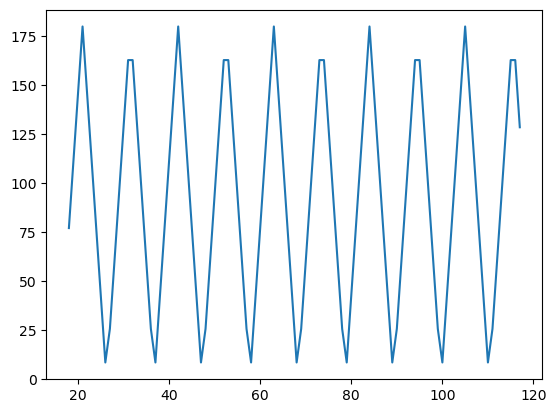

In [184]:
def find_minima(lst):
    minima = []
    for i in range(1, len(lst) - 1):
        if lst[i - 1] > lst[i] and lst[i + 1] > lst[i]:
            minima.append(i)
    return minima

bp_per_turn = 10.5 #(+-0.1) 
rise = 0.34 #(+-0.1) --> component of arc length
bp_range = 100 
min_arc = np.linalg.norm(positions[0] - positions[-1])
min_bp = int(np.ceil(min_arc / rise))
cumul_twist = np.arange(min_bp, min_bp+bp_range, 1) * 360/bp_per_turn
rotation_difference = 180
left_over = cumul_twist % 360 - rotation_difference
optimal_n_bp = min_bp + np.argmin(np.abs(left_over))
l = len(left_over)
plt.plot(np.arange(min_bp,l+min_bp,1),np.abs(left_over))


# check wanneer je de eerste keer onder je treshold zit ipv de minima te nemen
# dan krijg je geen dom lange ketens
# als dat niet lukt, dan moet je de search uitbreiden naar het volgende minima

minima = find_minima(np.abs(left_over))
# for each minima calculate tolerance
# if tolerance is within 0.1 bp_per_turn, then we have a solution, save those solutions, and keep the one with the lowest number of base pairs

total_twist_diff = left_over[optimal_n_bp-min_bp]
twist_diff_per_bp = total_twist_diff / optimal_n_bp
optimal_n_bp, total_twist_diff, twist_diff_per_bp
print('The optimal number of base pairs is:', optimal_n_bp)
print('The total twist difference is:', np.round(total_twist_diff,3),'deg with respect to the rotational difference of', rotation_difference,'deg')
print('Difference in twist per base pair is:', np.round(twist_diff_per_bp,3))
tolerance = np.abs((360/10.4)-(360/10.6))
# twist_diff_per_bp must be within tolerance 
if np.abs(twist_diff_per_bp) < tolerance:
    print(f'Within tolerance of {np.round(tolerance,3)} degrees per base pair.')
else:
    print(f'Not within tolerance of {np.round(tolerance,3)} degrees per base pair.')

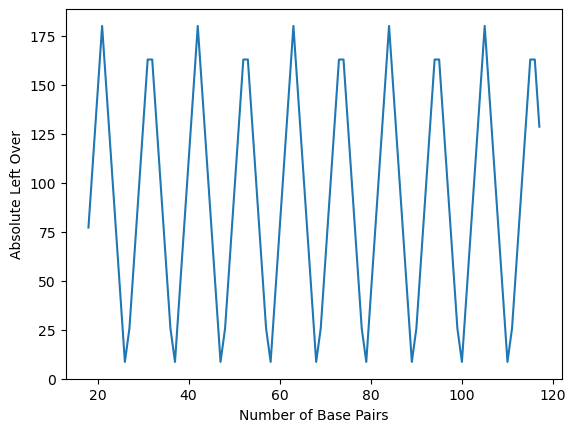

The optimal number of base pairs is: 26
The total twist difference is: -8.571 deg with respect to the rotational difference of 180 deg
Difference in twist per base pair is: -0.33
Within tolerance of 0.653 degrees per base pair.


In [185]:
import numpy as np
import matplotlib.pyplot as plt

def find_minima(lst):
    return [i for i in range(1, len(lst) - 1) if lst[i - 1] > lst[i] and lst[i + 1] > lst[i]]

bp_per_turn = 10.5  # Base pairs per turn (with a margin of ±0.1)
rise = 0.34         # Component of arc length (with a margin of ±0.1)
bp_range = 100
min_arc = np.linalg.norm(positions[0] - positions[-1])  # Assuming positions is defined
min_bp = int(np.ceil(min_arc / rise))
cumul_twist = np.arange(min_bp, min_bp + bp_range) * 360 / bp_per_turn
rotation_difference = 180
left_over = cumul_twist % 360 - rotation_difference

# Plotting
l = len(left_over)
plt.plot(np.arange(min_bp, l + min_bp), np.abs(left_over))
plt.xlabel('Number of Base Pairs')
plt.ylabel('Absolute Left Over')
plt.show()

# Find the first base pair number where the twist difference falls below the threshold
threshold = 0.1  # Define the threshold
first_below_threshold = next((idx for idx, val in enumerate(np.abs(left_over)) if val < threshold), None)
if first_below_threshold is not None:
    optimal_n_bp = min_bp + first_below_threshold
else:
    # If no value is below the threshold, find the next minima
    minima = find_minima(np.abs(left_over))
    optimal_n_bp = min_bp + minima[0] if minima else None

# Calculations and printing results
if optimal_n_bp is not None:
    total_twist_diff = left_over[optimal_n_bp - min_bp]
    twist_diff_per_bp = total_twist_diff / optimal_n_bp
    print('The optimal number of base pairs is:', optimal_n_bp)
    print('The total twist difference is:', np.round(total_twist_diff, 3), 'deg with respect to the rotational difference of', rotation_difference, 'deg')
    print('Difference in twist per base pair is:', np.round(twist_diff_per_bp, 3))

    tolerance = np.abs((360 / 10.4) - (360 / 10.6))
    if np.abs(twist_diff_per_bp) < tolerance:
        print(f'Within tolerance of {np.round(tolerance, 3)} degrees per base pair.')
    else:
        print(f'Not within tolerance of {np.round(tolerance, 3)} degrees per base pair.')
else:
    print("No optimal number of base pairs found within the specified range.")


In [123]:
optimal_n_bp, left_over[optimal_n_bp-min_bp],left_over[optimal_n_bp-min_bp]/optimal_n_bp 

(3827, -8.571428571420256, -0.0022397252603658887)

In [121]:
(360/10.4)-(360/10.6)

0.6531204644412156

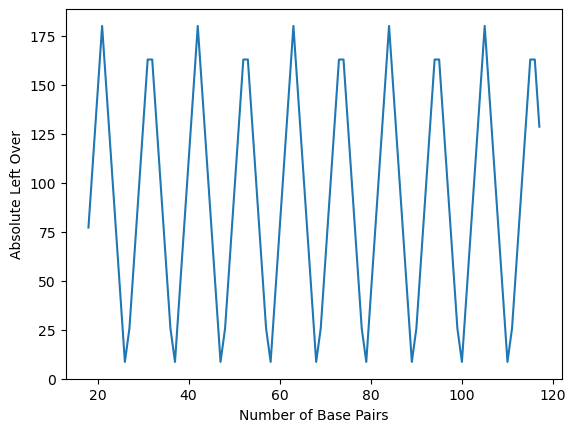

Optimal BP: 26, Twist Difference per BP: -0.33 degrees
Optimal BP: 37, Twist Difference per BP: 0.232 degrees
Optimal BP: 47, Twist Difference per BP: -0.182 degrees
Optimal BP: 58, Twist Difference per BP: 0.148 degrees
Optimal BP: 68, Twist Difference per BP: -0.126 degrees
Optimal BP: 79, Twist Difference per BP: 0.108 degrees
Optimal BP: 89, Twist Difference per BP: -0.096 degrees
Optimal BP: 100, Twist Difference per BP: 0.086 degrees
Optimal BP: 110, Twist Difference per BP: -0.078 degrees


In [187]:
import numpy as np
import matplotlib.pyplot as plt

def find_minima(lst):
    return [i for i in range(1, len(lst) - 1) if lst[i - 1] > lst[i] and lst[i + 1] > lst[i]]

def compute_left_over(bp_range, min_bp, bp_per_turn, rotation_difference):
    cumul_twist = np.arange(min_bp, min_bp + bp_range) * 360 / bp_per_turn
    return cumul_twist % 360 - rotation_difference

def compute_twist_diff_per_bp(optimal_bp, left_over, min_bp):
    total_twist_diff = left_over[optimal_bp - min_bp]
    return total_twist_diff / optimal_bp

def check_within_tolerance(twist_diff_per_bp, tolerance):
    return np.abs(twist_diff_per_bp) < tolerance

# Main calculations
bp_per_turn = 10.5  # Base pairs per turn (with a margin of ±0.1)
rise = 0.34         # Component of arc length (with a margin of ±0.1)
bp_range = 100
min_arc = np.linalg.norm(positions[0] - positions[-1])  # Assuming positions is defined
min_bp = int(np.ceil(min_arc / rise))
rotation_difference = 180
left_over = compute_left_over(bp_range, min_bp, bp_per_turn, rotation_difference)

# Plotting
plt.plot(np.arange(min_bp, min_bp + len(left_over)), np.abs(left_over))
plt.xlabel('Number of Base Pairs')
plt.ylabel('Absolute Left Over')
plt.show()

tolerance = np.abs((360 / 10.4) - (360 / 10.6))
minima = find_minima(np.abs(left_over))

# Compute and store results
results = []
for min_val in minima:
    optimal_bp = min_bp + min_val
    twist_diff_per_bp = compute_twist_diff_per_bp(optimal_bp, left_over, min_bp)
    if check_within_tolerance(twist_diff_per_bp, tolerance):
        results.append({
            'optimal_bp': optimal_bp,
            'twist_diff_per_bp': np.round(twist_diff_per_bp, 3)
        })

# Print results
if results:
    for result in results:
        print(f'Optimal BP: {result["optimal_bp"]}, Twist Difference per BP: {result["twist_diff_per_bp"]} degrees')
else:
    print("No optimal number of base pairs found within the specified tolerance.")


In [188]:
import numpy as np
import matplotlib.pyplot as plt

def find_minima(lst):
    """Finds the indices of local minima in a list."""
    return [i for i in range(1, len(lst) - 1) if lst[i - 1] > lst[i] and lst[i + 1] > lst[i]]

def compute_left_over(bp_range, min_bp, bp_per_turn, rotation_difference):
    """Computes the left-over rotational difference for a range of base pairs."""
    cumul_twist = np.arange(min_bp, min_bp + bp_range) * 360 / bp_per_turn
    return cumul_twist % 360 - rotation_difference

def compute_twist_diff_per_bp(optimal_bp, left_over, min_bp):
    """Calculates the twist difference per base pair for an optimal base pair number."""
    total_twist_diff = left_over[optimal_bp - min_bp]
    return total_twist_diff / optimal_bp

def check_within_tolerance(twist_diff_per_bp, tolerance):
    """Checks if the twist difference per base pair is within the specified tolerance."""
    return np.abs(twist_diff_per_bp) < tolerance

def find_optimal_bps(positions, bp_per_turn, rise, bp_range, rotation_difference, tolerance, plot=False):
    """Finds optimal base pairs that satisfy the given tolerance.

    Args:
    positions: The positions of base pairs.
    bp_per_turn: Base pairs per turn.
    rise: Component of arc length.
    bp_range: Range of base pairs to consider.
    rotation_difference: The target rotation difference.
    tolerance: The tolerance for accepting an optimal base pair number.
    plot: If True, plots the left-over rotational differences.

    Returns:
    A list of dictionaries containing optimal base pair numbers and their twist differences per base pair.
    """
    min_arc = np.linalg.norm(positions[0] - positions[-1])
    min_bp = int(np.ceil(min_arc / rise))
    left_over = compute_left_over(bp_range, min_bp, bp_per_turn, rotation_difference)

    if plot:
        # Plotting the left-over rotational differences
        plt.plot(np.arange(min_bp, min_bp + len(left_over)), np.abs(left_over))
        plt.xlabel('Number of Base Pairs')
        plt.ylabel('Absolute Left Over')
        plt.show()

    minima = find_minima(np.abs(left_over))
    results = []

    for min_val in minima:
        optimal_bp = min_bp + min_val
        twist_diff_per_bp = compute_twist_diff_per_bp(optimal_bp, left_over, min_bp)
        if check_within_tolerance(twist_diff_per_bp, tolerance):
            results.append({
                'optimal_bp': optimal_bp,
                'twist_diff_per_bp': np.round(twist_diff_per_bp, 3)
            })

    return results

# Example usage:
# Assuming positions is a predefined array of positions
positions =   # Define your positions array here
bp_per_turn = 10.5
rise = 0.34
bp_range = 100
rotation_difference = 180
tolerance = np.abs((360 / 10.4) - (360 / 10.6))

optimal_bps = find_optimal_bps(positions, bp_per_turn, rise, bp_range, rotation_difference, tolerance, plot=True)

# Printing results
if optimal_bps:
    for result in optimal_bps:
        print(f'Optimal BP: {result["optimal_bp"]}, Twist Difference per BP: {result["twist_diff_per_bp"]} degrees')
else:
    print("No optimal number of base pairs found within the specified tolerance.")


TypeError: unsupported operand type(s) for -: 'ellipsis' and 'ellipsis'

In [10]:

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_colored_frame(ax, point, orientation):
    '''Plots a frame with colored vectors at the given point and orientation, and returns the points plotted.'''
    colors = ['r', 'g', 'b']  # colors for forward, up, right
    for i, vector in enumerate(orientation):
        ax.quiver(*point, *vector, color=colors[i], length=1.0)
    return [point]

def plot_control_points(ax, control_points):
    '''Plots the control points and returns the points plotted.'''
    colors = ['magenta', 'cyan']
    plotted_points = []
    for i, point in enumerate(control_points):
        ax.scatter(*point, color=colors[i], label=f'Control Point {i+1}')
        plotted_points.append(point)
    ax.legend()
    return plotted_points



def create_3d_plot(data_points, xlabel='X', ylabel='Y', zlabel='Z'):
    '''Creates a 3D plot with dynamically adjusted axis limits based on data points.'''
    all_points = np.array(data_points).reshape(-1, 3)
    x_coords, y_coords, z_coords = all_points[:, 0], all_points[:, 1], all_points[:, 2]
    buffer = 1.0  # additional space around the points
    xlim = (min(x_coords) - buffer, max(x_coords) + buffer)
    ylim = (min(y_coords) - buffer, max(y_coords) + buffer)
    zlim = (min(z_coords) - buffer, max(z_coords) + buffer)
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_xlim3d(*xlim)
    ax.set_ylim3d(*ylim)
    ax.set_zlim3d(*zlim)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_zlabel(zlabel)
    return ax



# # Collect data points from plotting frames and control points
# plotted_points = []
# plotted_points += plot_colored_frame(ax, start_point, start_orientation)
# plotted_points += plot_colored_frame(ax, end_point, end_orientation)
# plotted_points += plot_control_points(ax, control_points)

# # Create plot with dynamically adjusted limits based on collected points
# ax = create_3d_plot(plotted_points)
# plot_colored_frame(ax, start_point, start_orientation)
# plot_colored_frame(ax, end_point, end_orientation)
# plot_control_points(ax, control_points)
# plt.show()


(array([0, 0, 0]),
 array([1.66666667, 0.        , 0.        ]),
 array([3.33333333, 0.        , 0.        ]),
 array([5, 0, 0]))

(-1.0, 1.0)

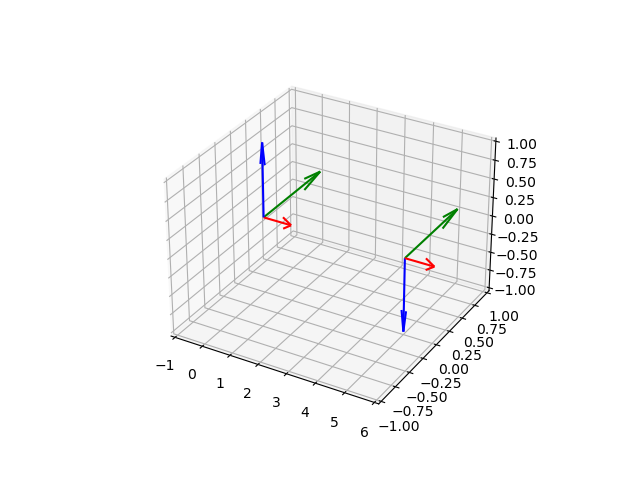

In [6]:
# Function to plot a frame with colored vectors
def plot_colored_frame(ax, point, orientation):
    colors = {'forward': 'r', 'up': 'g', 'right': 'b'}
    for key, vector in orientation.items():
        ax.quiver(*point, *vector, color=colors[key], length=1.0)

# Define the start and end points and their orientation vectors
start_point = np.array([0, 0, 0])
end_point = np.array([5, 0, 0])

start_orientation = {'forward': np.array([1, 0, 0]), 'up': np.array([0, 1, 0]), 'right': np.array([0, 0, 1])}
end_orientation = {'forward': np.array([1, 0, 0]), 'up': np.array([0, 1, 0]), 'right': np.array([0, 0, -1])}


# Create the plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the frames with colored vectors
plot_colored_frame(ax, start_point, start_orientation)
plot_colored_frame(ax, end_point, end_orientation)

# Set equal bounds for the plot
ax.set_xlim3d(-1, 6)
ax.set_ylim3d(-1, 1)
ax.set_zlim3d(-1, 1)

# As an initial guess use a control point in the direction of the forward vector of the start point
# and a control point in the direction of the forward vector of the end point but in the opposite direction 
# (since the spline is defined by the control points and the orientation of the first and last frame)
# write code that generates the initial guess based on the start and end point and their orientation vectors 
# also guess the initial path length by calculating the distance between the start and end point and the number of base pairs that can be distributed along the path
# use this initial path length to place the two additional control points along the path


(-1.0, 1.0)

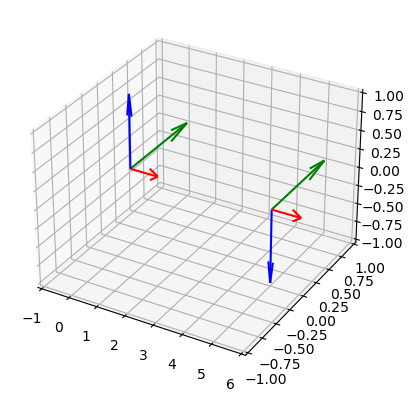

In [20]:
import numpy as np
import scipy.optimize as optimize
from scipy.interpolate import CubicSpline
from scipy.integrate import quad
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# Function to generate cubic spline
def generate_spline(control_points):
    t = np.linspace(0, 1, len(control_points))
    spline = CubicSpline(t, control_points, bc_type='natural')
    return spline

# Function to calculate the length of a curve based on a parametric representation
def curve_length(func, t0, t1):
    def integrand(t):
        dxdt, dydt, dzdt = func(t, 1)
        return np.sqrt(dxdt**2 + dydt**2 + dzdt**2)

    length, _ = quad(integrand, t0, t1)
    return length

# Function to calculate the orientation at each point along the spline
def calculate_orientations(spline, num_base_pairs, start_orientation, end_orientation):
    # Calculate the t values at which to evaluate the spline
    t_values = np.linspace(0, 1, num_base_pairs)

    # Store the orientation at each point
    orientations = []

    for i, t in enumerate(t_values):
        # Calculate the forward vector (tangent to the spline)
        forward = spline(t, 1)
        forward /= np.linalg.norm(forward)

        # Calculate the twist angle at this point
        twist_angle = i * twist_per_base_pair

        # Interpolate between the start and end 'up' orientations
        fraction = i / (num_base_pairs - 1)
        up_start = start_orientation['up']
        up_end = end_orientation['up']
        up = (1 - fraction) * up_start + fraction * up_end

        # Rotate the 'up' vector by the twist angle around the 'forward' vector
        up_rotated = rotate_vector(up, forward, np.radians(twist_angle))

        # Calculate the 'right' vector as the cross product of 'forward' and 'up_rotated'
        right = np.cross(forward, up_rotated)

        orientations.append({'forward': forward, 'up': up_rotated, 'right': right})

    return orientations

# Function to rotate a vector by a given angle around an axis
def rotate_vector(vec, axis, angle):
    """
    Rotate a vector around a given axis by a certain angle.

    Parameters:
    vec (np.array): Vector to be rotated.
    axis (np.array): Axis around which to rotate.
    angle (float): Angle in radians.

    Returns:
    np.array: Rotated vector.
    """
    axis = axis / np.linalg.norm(axis)
    cos_theta = np.cos(angle)
    sin_theta = np.sin(angle)
    return cos_theta * vec + sin_theta * np.cross(axis, vec) + (1 - cos_theta) * np.dot(axis, vec) * axis


# Define the start and end points and their orientation vectors again
start_point = np.array([0, 0, 0])
end_point = np.array([12, 3, 5])

# Define initial control points for cubic spline
control_points = np.array([
    start_point,
    (start_point + end_point) / 2,  # Midpoint
    end_point
])

# Generate the initial spline
initial_spline = generate_spline(control_points)

# Calculate the arc length of the initial spline
arc_length = curve_length(initial_spline, 0, 1)

# Constants
rise_per_base_pair = 0.34  # nm

# Calculate number of base pairs that can be distributed along the spline
num_base_pairs = int(arc_length / rise_per_base_pair)

arc_length, num_base_pairs


# Constants for DNA twist
base_pairs_per_turn = 10.5
twist_per_base_pair = 360 / base_pairs_per_turn  # degrees


# Define the start and end orientations
start_orientation = {'forward': np.array([1, 0, 0]), 'up': np.array([0, 1, 0]), 'right': np.array([0, 0, 1])}
end_orientation = {'forward': np.array([1, 0, 0]), 'up': np.array([0, 1, 0]), 'right': np.array([0, 0, -1])}

# Calculate the orientations along the spline
orientations = calculate_orientations(initial_spline, num_base_pairs, start_orientation, end_orientation)

# Let's check the first and last orientations
orientations[0], orientations[-1]



({'forward': array([0.89943803, 0.22485951, 0.37476584]),
  'up': array([0., 1., 0.]),
  'right': array([-0.37476584,  0.        ,  0.89943803])},
 {'forward': array([0.89943803, 0.22485951, 0.37476584]),
  'up': array([ 0.60541038, -0.64542565, -0.46572953]),
  'right': array([ 0.13715978,  0.64578198, -0.71665266])})

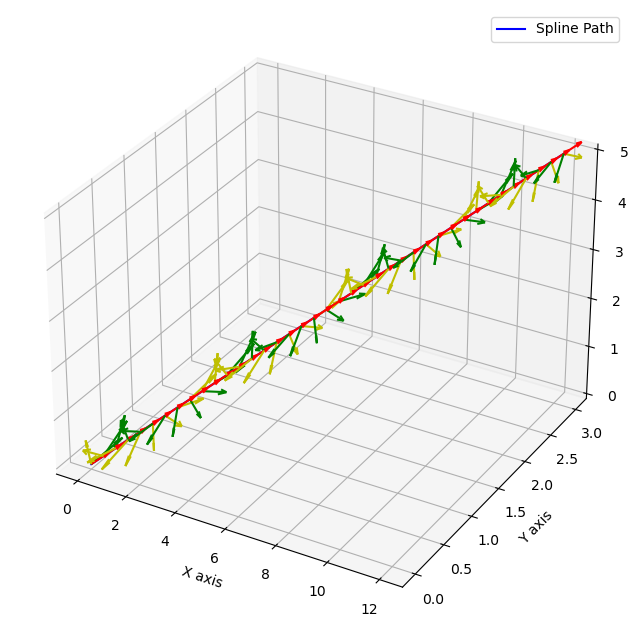

In [21]:
def plot_spline_with_orientations(spline, orientations, num_points=100):
    """
    Plot the cubic spline and the orientation vectors at each base pair.

    Parameters:
    spline (CubicSpline): The cubic spline representing the DNA path.
    orientations (list): List of orientation dictionaries at each base pair.
    num_points (int): Number of points to use for plotting the spline.
    """
    # Generate points along the spline for plotting
    t_plot = np.linspace(0, 1, num_points)
    spline_points = spline(t_plot)

    # Generate the t values for base pairs
    t_base_pairs = np.linspace(0, 1, len(orientations))

    # Plotting
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plot the spline
    ax.plot(spline_points[:, 0], spline_points[:, 1], spline_points[:, 2], 'b-', label='Spline Path')

    # Plot the orientation vectors at each base pair
    for i, orientation in enumerate(orientations):
        base_point = spline(t_base_pairs[i])
        forward = orientation['forward']
        up = orientation['up']
        right = orientation['right']

        # Scale for visualization
        scale = 0.5

        # Plot forward vector
        ax.quiver(base_point[0], base_point[1], base_point[2], forward[0], forward[1], forward[2], color='r', length=scale, normalize=True)

        # Plot up vector
        ax.quiver(base_point[0], base_point[1], base_point[2], up[0], up[1], up[2], color='g', length=scale, normalize=True)

        # Plot right vector
        ax.quiver(base_point[0], base_point[1], base_point[2], right[0], right[1], right[2], color='y', length=scale, normalize=True)

    # Axes labels
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_zlabel('Z axis')

    # Legend
    ax.legend()

    plt.show()

# Plot the spline with orientations
plot_spline_with_orientations(initial_spline, orientations)
